## Summary

- save seurate obj into loom seems can store RNA counts, however, if save it to h5ad, only the variable genes can be saved
- save seurate obj into h5ad can save the umap embedding, not in the loom case
- both loom and h5ad can't save the spliced and unspliced counts

Anndata not easy to change X,

so we read loom and h5ad, copy the umap to loom obj in python

scVelco is faster than VeloCyto

In [1]:
import scvelo as scv


In [2]:
file = "mouseBM_with_velo.loom"
adata_loom = scv.read_loom(file)
adata_loom
file = "mouseBM.h5ad"
adata = scv.read(file)
adata

AnnData object with n_obs × n_vars = 13949 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'percent.mt', 'RNA.weight', 'ADT.weight', 'wsnn_res.1', 'seurat_clusters', 'Blood_pred', 'BM_pred', 'Bone_pred', 'id'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_wnn.umap'
    varm: 'PCs'
    obsp: 'distances'

In [3]:
adata_loom.obsm['X_wnn.umap'] = adata.obsm['X_wnn.umap']
s = scv.read("spliced.csv")
u = scv.read("unspliced.csv")
adata_loom.layers['spliced'] = s.X
adata_loom.layers['unspliced'] = u.X

In [11]:
adata_loom.obs['seurat_clusters'] = adata_loom.obs['seurat_clusters'].apply(lambda x:int(x)+1)

In [6]:
adata_loom.obs['seurat_clusters'].nunique()

17

Filtered out 20764 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:12) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:24) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


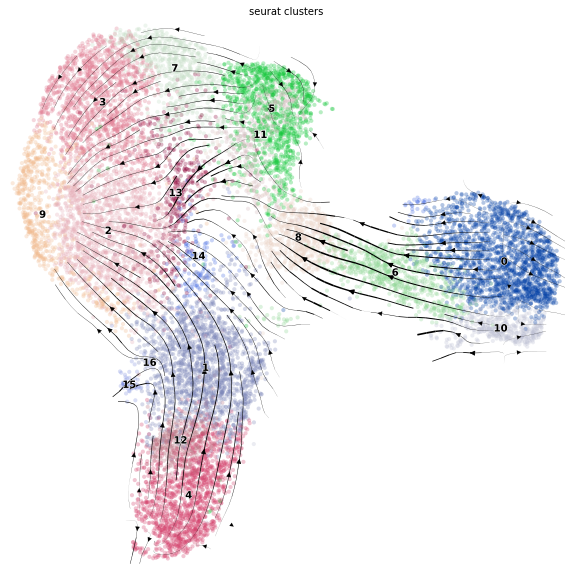

In [5]:

scv.pp.filter_and_normalize(adata_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata_loom, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata_loom)
scv.tl.velocity_graph(adata_loom)
scv.pl.velocity_embedding_stream(adata_loom, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10))


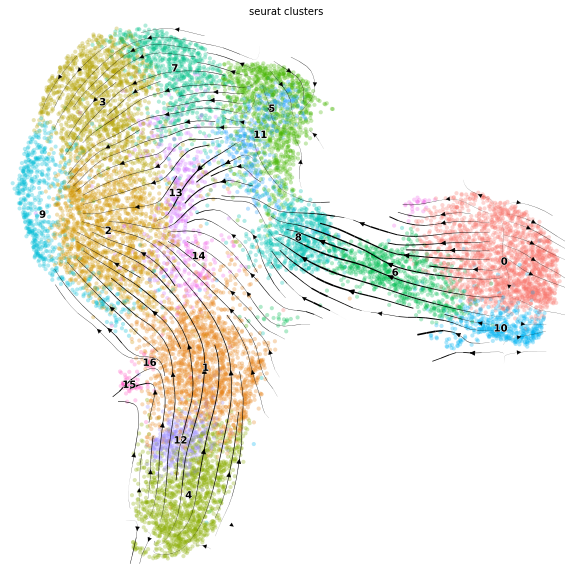

In [17]:
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_loom, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


In [71]:
file = "mouseBM_with_velo.loom"
adata_loom = scv.read_loom(file)
adata_loom
file = "mouseBM.h5ad"
adata = scv.read(file)
adata
adata_loom.obsm['X_wnn.umap'] = adata.obsm['X_wnn.umap']
s = scv.read("spliced.csv")
u = scv.read("unspliced.csv")
adata_loom.layers['spliced'] = s.X
adata_loom.layers['unspliced'] = u.X
adata_loom.obs['seurat_clusters'] = adata_loom.obs['seurat_clusters'].apply(lambda x:str(int(x)-1))


In [72]:
adata_loom.obs['seurat_clusters'] = adata_loom.obs['seurat_clusters'].astype('category')


In [6]:
adata_loom

AnnData object with n_obs × n_vars = 13949 × 31053
    obs: 'ADT.weight', 'BM_pred', 'Blood_pred', 'Bone_pred', 'RNA.weight', 'id', 'nCount_ADT', 'nCount_RNA', 'nCount_ambiguous', 'nCount_spliced', 'nCount_unspliced', 'nFeature_ADT', 'nFeature_RNA', 'nFeature_ambiguous', 'nFeature_spliced', 'nFeature_unspliced', 'orig.ident', 'percent.mt', 'seurat_clusters', 'wsnn_res.1'
    obsm: 'X_wnn.umap'
    layers: 'counts', 'spliced', 'unspliced'

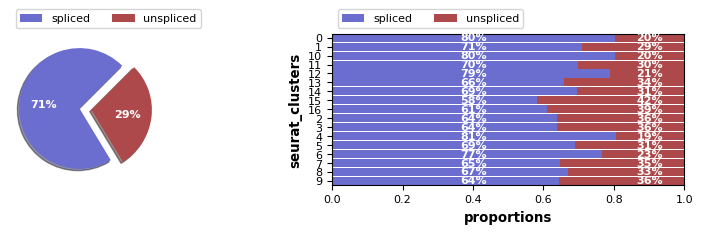

In [9]:
scv.pl.proportions(adata_loom,groupby="seurat_clusters")


In [11]:
scv.pp.filter_and_normalize(adata_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata_loom, n_pcs=30, n_neighbors=30)

Filtered out 20764 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:11) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [ ]:
scv.tl.velocity(adata)


In [83]:
adata_no_murk.var_names

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'AC149090.1', 'CAAA01118383.1', 'Vmn2r122',
       'CAAA01147332.1'],
      dtype='object', name='Gene', length=31053)

In [3]:
# MURK genes


import pandas as pd
adata_no_murk = adata_loom.copy()
murk_genes = list(pd.read_csv('MURK.mouse.list',header=None)[0])
list_no_murk =[gene for gene in adata_no_murk.var_names if gene not in murk_genes]
adata_no_murk = adata_no_murk[:,list_no_murk]


In [84]:
len([gene for gene in adata_no_murk.var_names if gene in murk_genes])

97

In [103]:
import scanpy as sc


In [104]:
tt = sc.tl.rank_genes_groups(adata_loom, "seurat_clusters", inplace = False)

... storing 'id' as categorical
... storing 'orig.ident' as categorical


In [109]:
?sc.tl.rank_genes_groups

Signature:
sc.tl.rank_genes_groups(
    adata: anndata._core.anndata.AnnData,
    groupby: str,
    use_raw: bool = True,
    groups: Union[Literal['all'], Iterable[str]] = 'all',
    reference: str = 'rest',
    n_genes: Union[int, NoneType] = None,
    rankby_abs: bool = False,
    pts: bool = False,
    key_added: Union[str, NoneType] = None,
    copy: bool = False,
    method: Union[Literal['logreg', 't-test', 'wilcoxon', 't-test_overestim_var'], NoneType] = None,
    corr_method: Literal['benjamini-hochberg', 'bonferroni'] = 'benjamini-hochberg',
    tie_correct: bool = False,
    layer: Union[str, NoneType] = None,
    **kwds,
) -> Union[anndata._core.anndata.AnnData, NoneType]
Docstring:
Rank genes for characterizing groups.

Expects logarithmized data.

Parameters
----------
adata : AnnData
    Annotated data matrix.
groupby : str
    The key of the observations grouping to consider.
use_raw : bool, optional (default: True)
    Use `raw` attribute of `adata` if present.
layer :

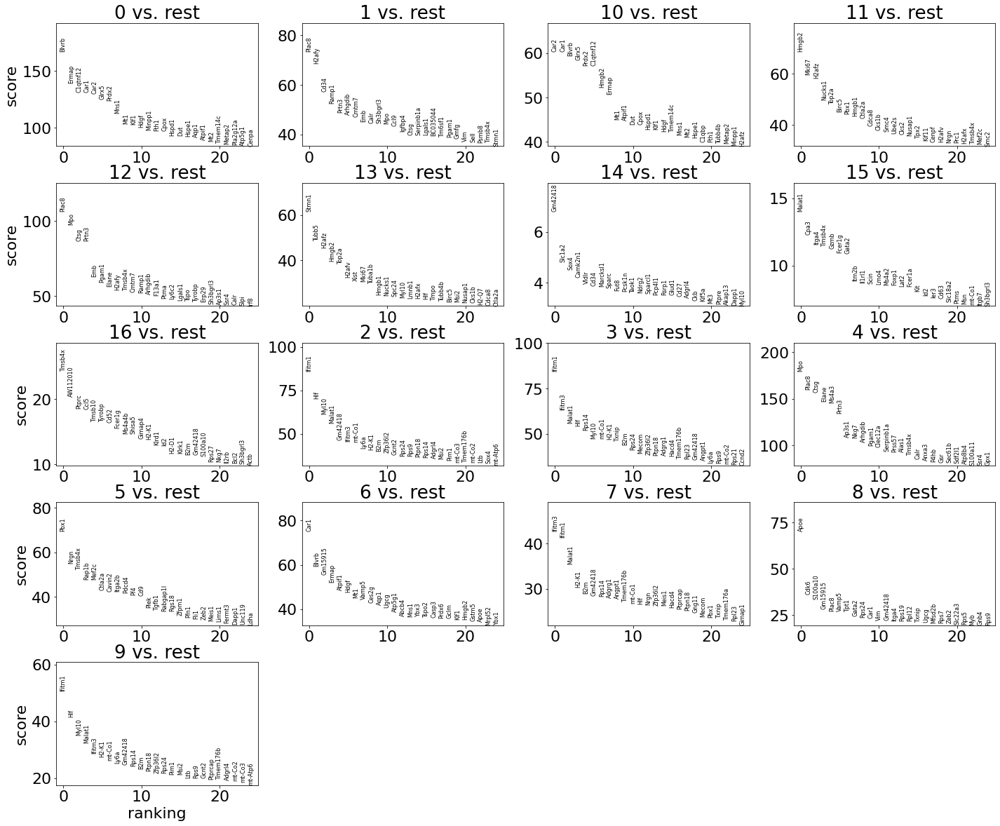

In [110]:
sc.tl.rank_genes_groups(adata_loom, 'seurat_clusters', method='t-test')
sc.pl.rank_genes_groups(adata_loom, n_genes=25, sharey=False)

In [125]:
pd.DataFrame(adata_loom.uns['rank_genes_groups']['names']).head(n=1000)['0']

0         Blvrb
1         Ermap
2      C1qtnf12
3          Car1
4          Car2
         ...   
995       Rmdn3
996    Aasdhppt
997       Rps12
998        Dna2
999       Mylpf
Name: 0, Length: 1000, dtype: object

In [126]:
ery_list = pd.DataFrame(adata_loom.uns['rank_genes_groups']['names']).head(n=1000)["0"].tolist()

In [137]:
pd.read_csv("markers.tsv",sep="\t",header=None)

,0,1
0,Dendritic cell,"Batf3, Ifi205, Mycl, Slamf7"
1,Eosinophil,"Epx, Il15, Il4, Mpo, Prg2, Prg3"
2,Granulocyte,"Camp, Cebpe, Chd7, Far2, Gfi1, Lyz1, Mapk31, P..."
3,Hematopoietic stem cell progenitor cell,"Alox5, Csf1, Egr1, Fos, Gata1, Gata2, Gfi1b, I..."
4,Hematopoietic stem cell,"Btg2, Ctla2a, Egr1, Fosb, Gata2, Gm17757, Hlf,..."
5,Macrophage and dendritic cell precursor cell,"CD115, CD135, Cx3cr1"
6,Monocyte,"Ctss, Cybb, Irf8, Ly6a, Slpi"
7,Myeloid progenitor cell,"Kcnip3, Med21, Sgms2, Tfec"
8,Neutrophil,"Cebpe, Csf3r, Elane, Gfi1"
9,Red blood cell (erythrocyte),"Car1, Clec4d, Gata1, Gfi1b, Klf1, Mfsd2b, Nfia..."


In [135]:
m = pd.read_csv("markers.tsv",sep="\t",header=None)
m[2] = [x.split(", ") for x in m[1]]
myGene_list = [j for sub in m[2] for j in sub]
myGene_list

['Batf3',
 'Ifi205',
 'Mycl',
 'Slamf7',
 'Epx',
 'Il15',
 'Il4',
 'Mpo',
 'Prg2',
 'Prg3',
 'Camp',
 'Cebpe',
 'Chd7',
 'Far2',
 'Gfi1',
 'Lyz1',
 'Mapk31',
 'Prkcb',
 'S100a8',
 'Tanc1',
 'Tmem53',
 'Trem3',
 'Alox5',
 'Csf1',
 'Egr1',
 'Fos',
 'Gata1',
 'Gata2',
 'Gfi1b',
 'Ikzf2',
 'Jun',
 'Btg2',
 'Ctla2a',
 'Egr1',
 'Fosb',
 'Gata2',
 'Gm17757',
 'Hlf',
 'Ikzf2',
 'Mecom',
 'Meis1',
 'Mpl',
 'Pbx1',
 'Pigr',
 'Ptrf',
 'Satb1',
 'Sox4',
 'Tsc22d1',
 'CD115',
 'CD135',
 'Cx3cr1',
 'Ctss',
 'Cybb',
 'Irf8',
 'Ly6a',
 'Slpi',
 'Kcnip3',
 'Med21',
 'Sgms2',
 'Tfec',
 'Cebpe',
 'Csf3r',
 'Elane',
 'Gfi1',
 'Car1',
 'Clec4d',
 'Gata1',
 'Gfi1b',
 'Klf1',
 'Mfsd2b',
 'Nfia',
 'Slc45a3']

Trying to set attribute `.obs` of view, copying.


Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/64 cores)
    finished (0:00:24) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph
    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


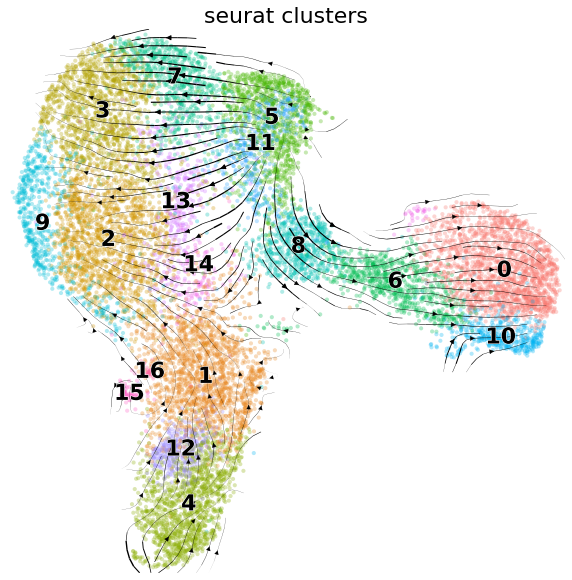

In [136]:
# second

import pandas as pd
adata_no_murk = adata_loom.copy()
murk_genes = myGene_list+["Eomes"]
list_no_murk =[gene for gene in adata_no_murk.var_names if gene in murk_genes]
adata_no_murk = adata_no_murk[:,list_no_murk]
scv.pp.filter_and_normalize(adata_no_murk)
# scv.pp.moments(adata_no_murk,n_pcs =50,n_neighbors=80,use_highly_variable =False)
scv.pp.moments(adata_no_murk)

scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
scv.tl.velocity(adata_no_murk,mode="dynamical")
# scv.tl.velocity_graph(adata_no_murk,n_neighbors=100,basis="X_wnn.umap")
scv.tl.velocity_graph(adata_no_murk,basis="X_wnn.umap")
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


In [143]:
mWT = adata_no_murk[adata_no_murk.obs['orig.ident']=="mWT",:]
mNFIXko = adata_no_murk[adata_no_murk.obs['orig.ident']=="mNFIXko",:]

Trying to set attribute `.obs` of view, copying.


Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/64 cores)
    finished (0:00:28) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph
    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


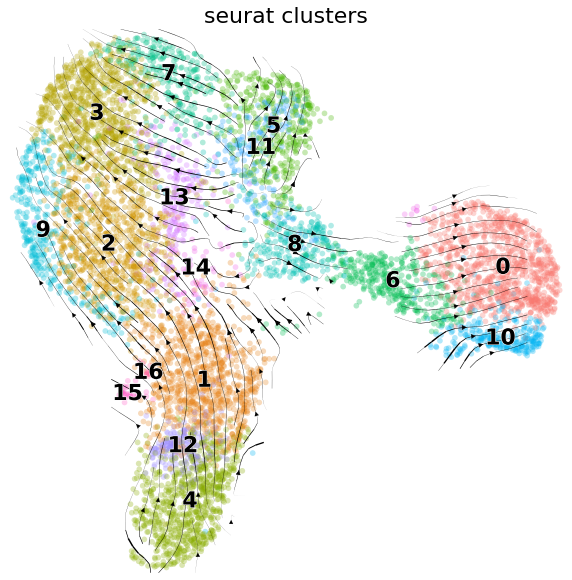

In [144]:
# second

import pandas as pd
adata_no_murk = adata_loom.copy()
murk_genes = myGene_list+["Eomes"]
list_no_murk =[gene for gene in adata_no_murk.var_names if gene in murk_genes]
adata_no_murk = adata_no_murk[:,list_no_murk]
adata_no_murk = adata_no_murk[adata_no_murk.obs['orig.ident']=="mWT",:]
scv.pp.filter_and_normalize(adata_no_murk)
# scv.pp.moments(adata_no_murk,n_pcs =50,n_neighbors=80,use_highly_variable =False)
scv.pp.moments(adata_no_murk)

scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
scv.tl.velocity(adata_no_murk,mode="dynamical")
# scv.tl.velocity_graph(adata_no_murk,n_neighbors=100,basis="X_wnn.umap")
scv.tl.velocity_graph(adata_no_murk,basis="X_wnn.umap")
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


Trying to set attribute `.obs` of view, copying.


Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/64 cores)


  0%|          | 0/11 [00:00<?, ?gene/s]

    finished (0:00:10) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


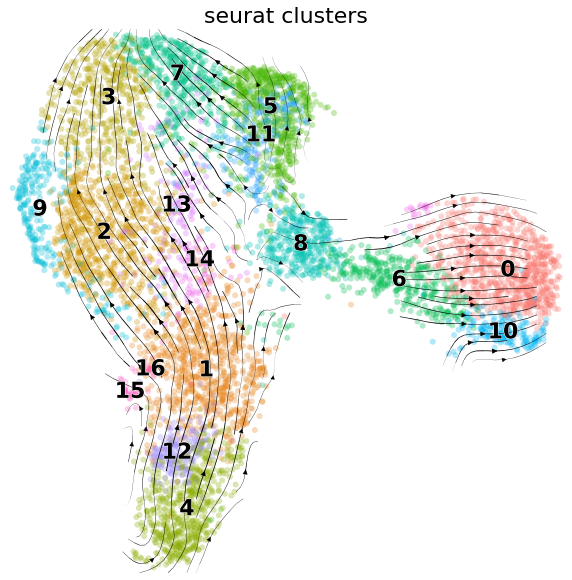

In [145]:
# second

import pandas as pd
adata_no_murk = adata_loom.copy()
murk_genes = myGene_list+["Eomes"]
list_no_murk =[gene for gene in adata_no_murk.var_names if gene in murk_genes]
adata_no_murk = adata_no_murk[:,list_no_murk]
adata_no_murk = adata_no_murk[adata_no_murk.obs['orig.ident']=="mNFIXko",:]
scv.pp.filter_and_normalize(adata_no_murk)
# scv.pp.moments(adata_no_murk,n_pcs =50,n_neighbors=80,use_highly_variable =False)
scv.pp.moments(adata_no_murk)

scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
scv.tl.velocity(adata_no_murk,mode="dynamical")
# scv.tl.velocity_graph(adata_no_murk,n_neighbors=100,basis="X_wnn.umap")
scv.tl.velocity_graph(adata_no_murk,basis="X_wnn.umap")
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


In [141]:
adata_no_murk.obs

,ADT.weight,BM_pred,Blood_pred,Bone_pred,RNA.weight,id,nCount_ADT,nCount_RNA,nCount_ambiguous,nCount_spliced,...,nFeature_unspliced,orig.ident,percent.mt,seurat_clusters,wsnn_res.1,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition
CellID,,,,,,,,,,,,,,,,,,,,,
mWT_AAACCCAAGTGATCGG-1,0.870270,7,10,9,0.129730,reference,103.0,3787.0,292.0,2652.0,...,1059,mWT,5.307631,9,17,8.0,5.0,9.804873,9.804873,0.026128
mWT_AAACCCACAAACCATC-1,0.959198,3,4,4,0.040802,reference,284.0,13420.0,1009.0,9371.0,...,3016,mWT,3.204173,3,11,8.0,19.0,12.440100,12.440100,0.080405
mWT_AAACCCACACTGTCCT-1,0.864076,1,1,1,0.135924,reference,208.0,20299.0,1047.0,15026.0,...,1843,mWT,1.059165,0,1,26.0,11.0,7.974238,7.974238,0.156246
mWT_AAACCCACAGCCATTA-1,0.881692,7,10,9,0.118308,reference,180.0,11463.0,780.0,8139.0,...,2130,mWT,2.852656,9,17,17.0,9.0,12.544506,12.544506,0.587925
mWT_AAACCCAGTACCTAAC-1,0.998782,5,6,6,0.001218,reference,414.0,22463.0,1477.0,16033.0,...,3391,mWT,3.770645,5,13,15.0,14.0,19.616299,19.616299,0.020365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mNFIXko_TTTGTTGCAAGTGGGT-1,0.699054,4,5,5,0.300946,reference,126.0,20980.0,1074.0,15473.0,...,2219,mNFIXko,2.936130,4,12,13.0,13.0,18.532536,18.532536,0.005656
mNFIXko_TTTGTTGCACGCTATA-1,0.723788,3,4,4,0.276212,reference,248.0,4128.0,349.0,2912.0,...,1241,mNFIXko,4.215116,3,11,6.0,3.0,14.768336,14.768336,0.076991
mNFIXko_TTTGTTGCAGTAACCT-1,0.621971,4,7,7,0.378029,reference,58.0,9025.0,678.0,6384.0,...,2012,mNFIXko,3.235457,6,14,5.0,7.0,10.590538,10.590538,0.148796


Trying to set attribute `.obs` of view, copying.


Filtered out 16290 genes that are detected 20 counts (spliced).
Filtered out 828 genes that are detected 2 counts (unspliced).
Filtered out 2915 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:05) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/64 cores)


  0%|          | 0/703 [00:00<?, ?gene/s]

    finished (0:01:23) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph
    finished (0:00:24) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


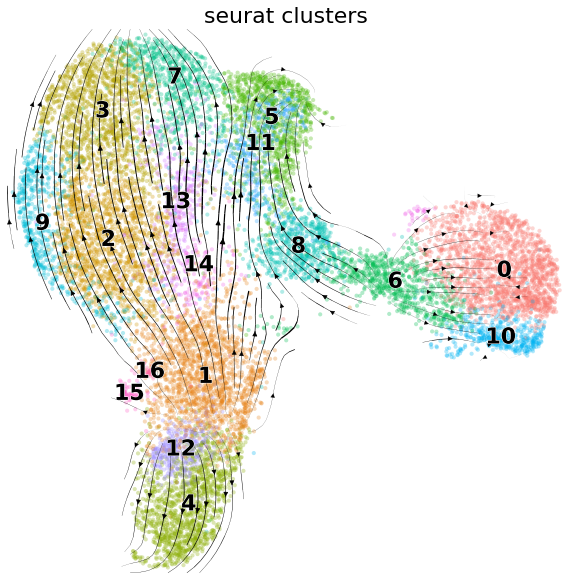

In [132]:
# second

import pandas as pd
adata_no_murk = adata_loom.copy()
murk_genes = list(pd.read_csv('MURK.mouse.list',header=None)[0])+ery_list+["Mamstr","Cln3","Gm48444","Cacna1d","Rnf13","Casp4"]
list_no_murk =[gene for gene in adata_no_murk.var_names if gene not in murk_genes]
adata_no_murk = adata_no_murk[:,list_no_murk]
scv.pp.filter_and_normalize(adata_no_murk,min_shared_counts=20, n_top_genes=2000,min_counts=20,min_counts_u=2)
# scv.pp.moments(adata_no_murk,n_pcs =50,n_neighbors=80,use_highly_variable =False)
scv.pp.moments(adata_no_murk)

scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
scv.tl.velocity(adata_no_murk,mode="dynamical")
# scv.tl.velocity_graph(adata_no_murk,n_neighbors=100,basis="X_wnn.umap")
scv.tl.velocity_graph(adata_no_murk,basis="X_wnn.umap")
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/64 cores)


  0%|          | 0/97 [00:00<?, ?gene/s]

    finished (0:00:11) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
        Consider computing the graph in an unbiased manner 
        on full expression space by not specifying basis.

computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


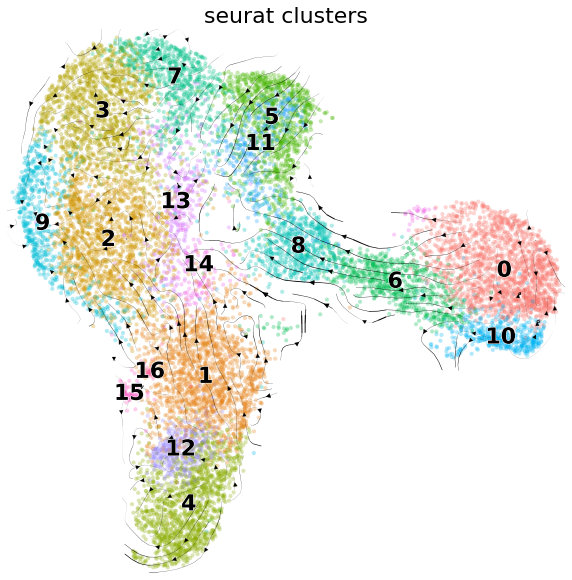

In [93]:
# second

import pandas as pd
adata_no_murk = adata_loom.copy()
murk_genes = list(pd.read_csv('MURK.mouse.list',header=None)[0])+["Mamstr","Cln3","Gm48444","Eomes","Cacna1d","Rnf13","Casp4"]
list_no_murk =[gene for gene in adata_no_murk.var_names if gene not in murk_genes]
list_no_murk =[gene for gene in adata_no_murk.var_names if gene in murk_genes] + list(adata_no_murk.var_names)[:1000]
# list_no_murk =murk_genes
adata_no_murk = adata_no_murk[:,list_no_murk]


scv.pp.filter_and_normalize(adata_no_murk)
# scv.pp.filter_and_normalize(adata_no_murk,min_shared_counts=20, n_top_genes=2000,min_counts=20)
scv.pp.moments(adata_no_murk,n_neighbors=10)
scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
scv.tl.velocity(adata_no_murk,mode="dynamical")
scv.tl.velocity_graph(adata_no_murk,n_neighbors=10,basis="X_wnn.umap")
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


In [90]:
?scv.tl.velocity_graph

Signature:
scv.tl.velocity_graph(
    data,
    vkey='velocity',
    xkey='Ms',
    tkey=None,
    basis=None,
    n_neighbors=None,
    n_recurse_neighbors=None,
    random_neighbors_at_max=None,
    sqrt_transform=None,
    variance_stabilization=None,
    gene_subset=None,
    compute_uncertainties=None,
    approx=None,
    mode_neighbors='distances',
    copy=False,
)
Docstring:
Computes velocity graph based on cosine similarities.

The cosine similarities are computed between velocities and potential cell state
transitions, i.e. it measures how well a corresponding change in gene expression
:math:`\delta_{ij} = x_j - x_i` matches the predicted change according to the
velocity vector :math:`\nu_i`,

.. math::
    \pi_{ij} = \cos\angle(\delta_{ij}, \nu_i)
    = \frac{\delta_{ij}^T \nu_i}{\left\lVert\delta_{ij}\right\rVert \left\lVert \nu_i \right\rVert}.

Arguments
---------
data: :class:`~anndata.AnnData`
    Annotated data matrix.
vkey: `str` (default: `'velocity'`)
    Name of v

Trying to set attribute `.obs` of view, copying.


Filtered out 20707 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:10) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/64 cores)


  0%|          | 0/1004 [00:00<?, ?gene/s]

    finished (0:02:17) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:11) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:01:40) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


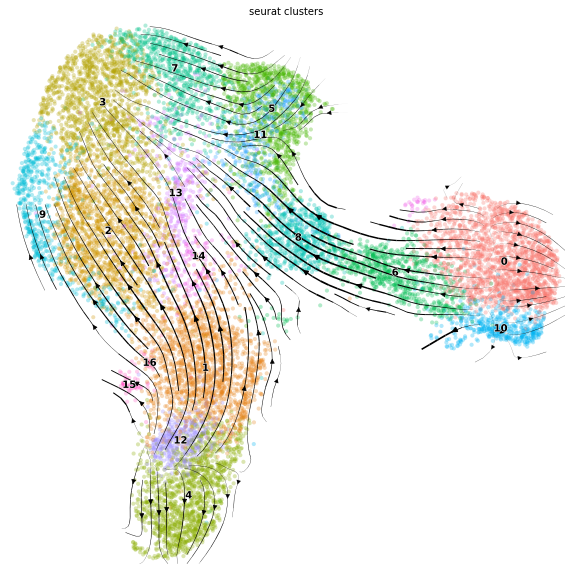

In [12]:

scv.pp.filter_and_normalize(adata_no_murk,min_shared_counts=20, n_top_genes=2000,min_counts=20)
scv.pp.moments(adata_no_murk,n_neighbors=80)
scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
scv.tl.velocity(adata_no_murk,mode="dynamical")
scv.tl.velocity_graph(adata_no_murk)
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


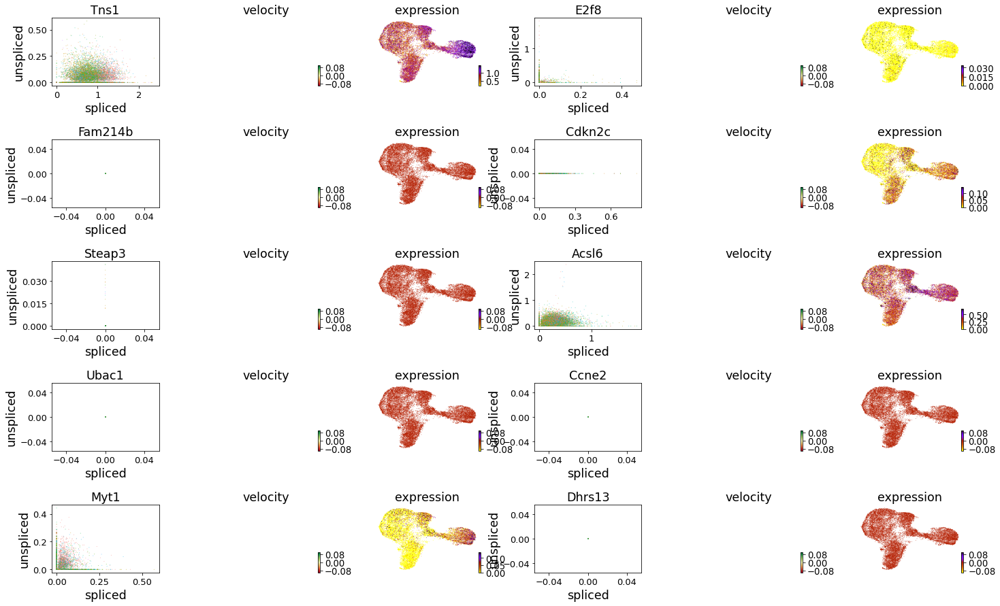

In [102]:
n=60
scv.pl.velocity(adata_no_murk,murk_genes[n:n+10],color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

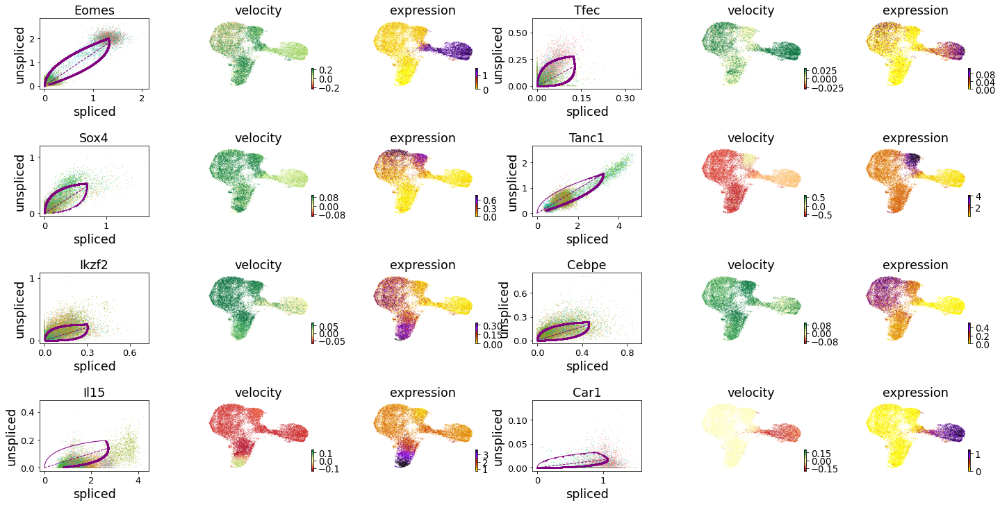

In [139]:
top_genes = adata_no_murk.var.sort_values('fit_likelihood', ascending=False).index[:8]
scv.pl.velocity(adata_no_murk,top_genes,color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

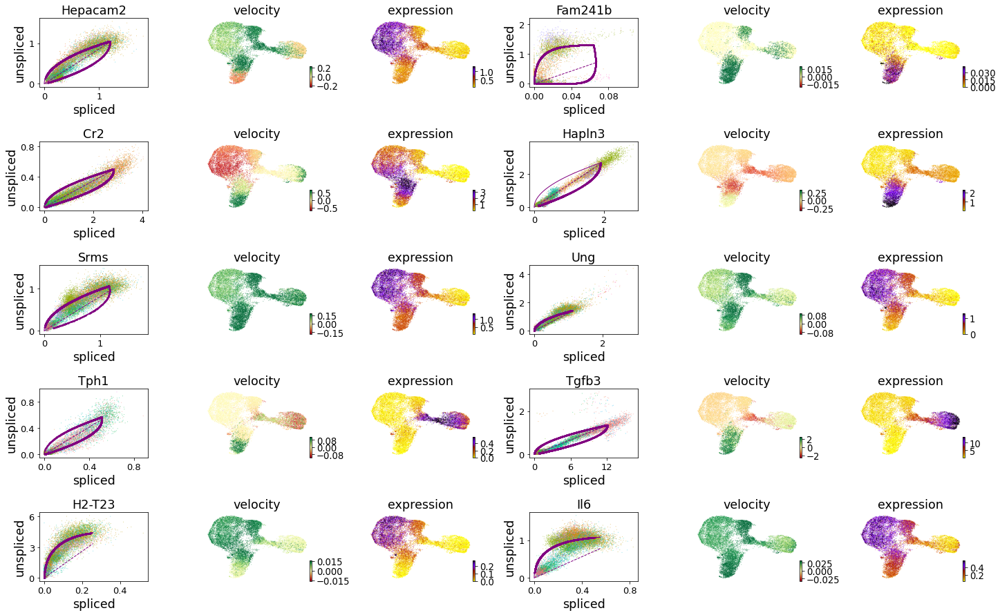

In [130]:
top_genes = adata_no_murk.var.sort_values('fit_likelihood', ascending=False).index[10:20]
scv.pl.velocity(adata_no_murk,top_genes,color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

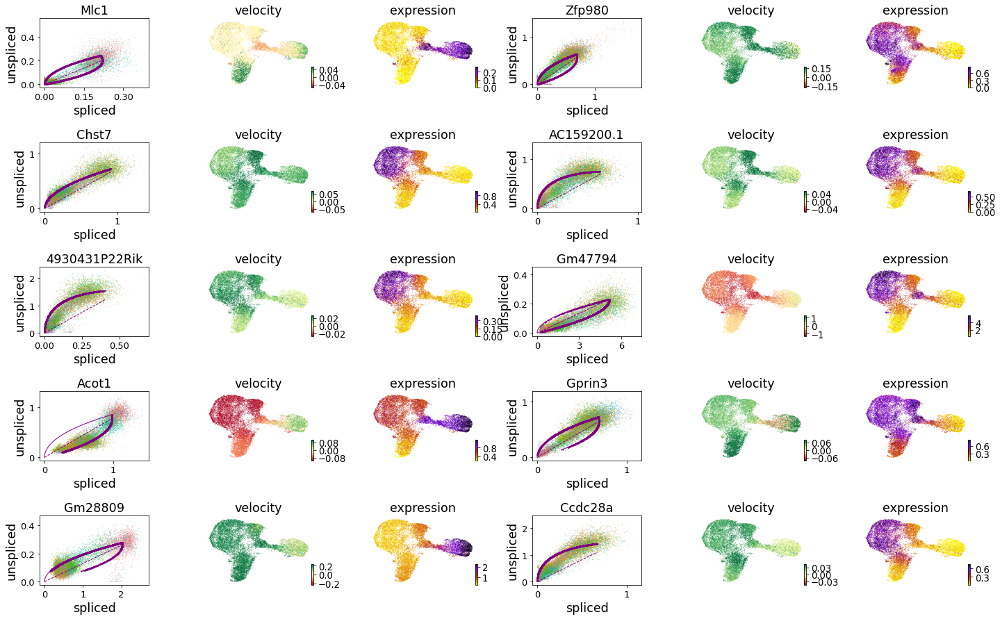

In [131]:
top_genes = adata_no_murk.var.sort_values('fit_likelihood', ascending=False).index[20:30]
scv.pl.velocity(adata_no_murk,top_genes,color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

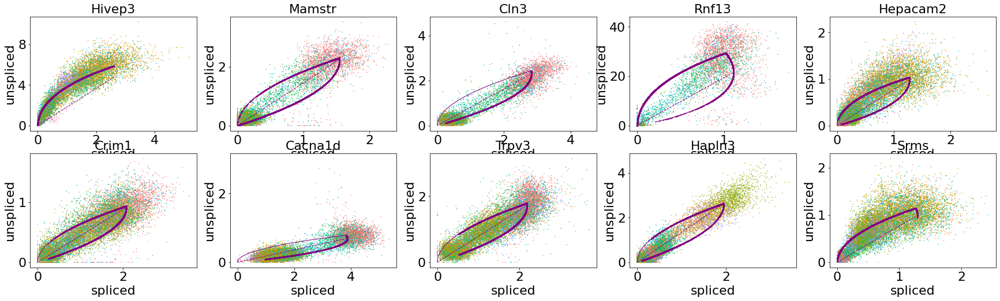

In [53]:
top_genes = adata_no_murk.var.sort_values('fit_likelihood', ascending=False).index[:10]
scv.pl.scatter(adata_no_murk, basis=top_genes,color="seurat_clusters",ncols=5,hspace=0.2,palette=cdict)

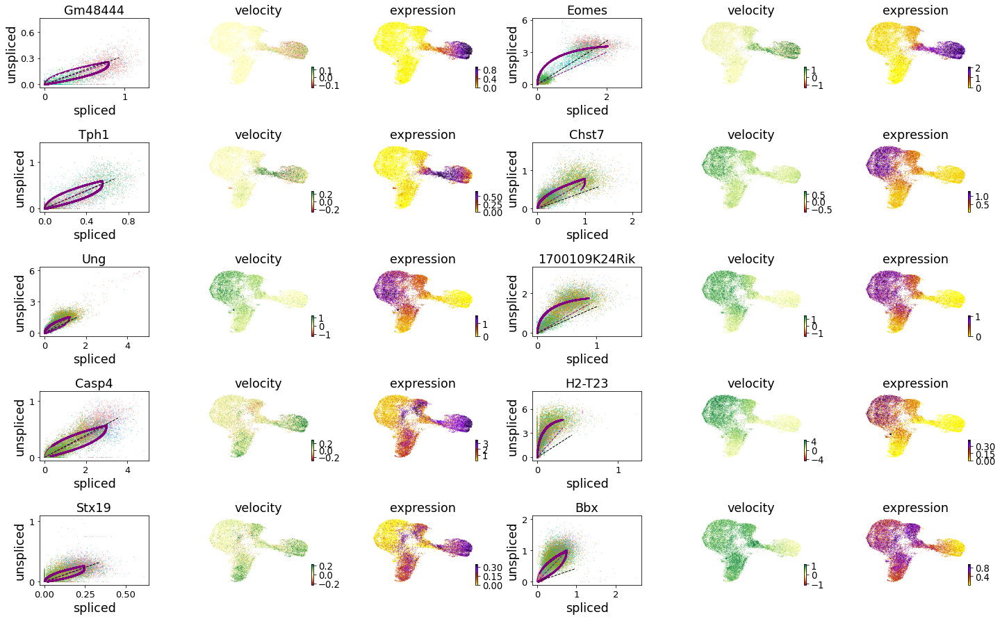

In [67]:
top_genes = adata_no_murk.var.sort_values('fit_likelihood', ascending=False).index[10:20]
scv.pl.velocity(adata_no_murk,top_genes,color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

In [55]:
top_genes

Index(['Hivep3', 'Mamstr', 'Cln3', 'Rnf13', 'Hepacam2', 'Crim1', 'Cacna1d',
       'Trpv3', 'Hapln3', 'Srms'],
      dtype='object', name='Gene')

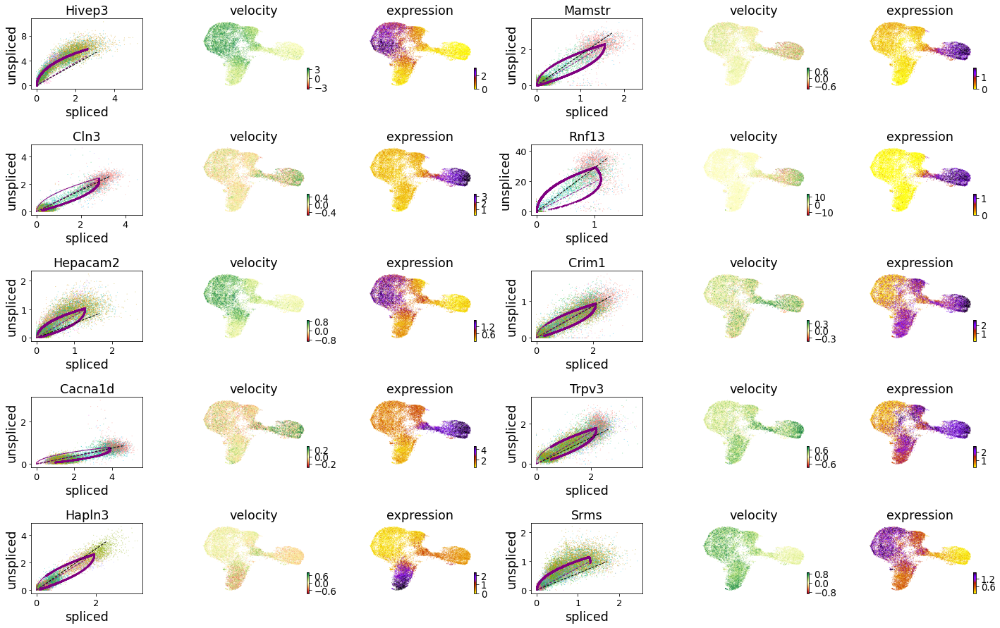

In [65]:
scv.pl.velocity(adata_no_murk,top_genes,color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

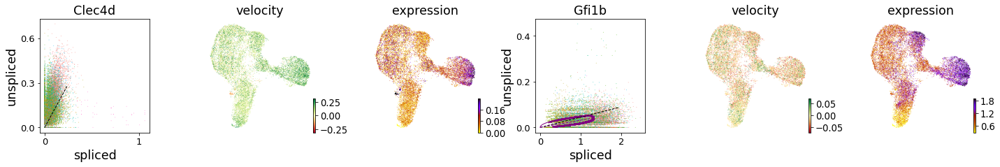

In [66]:
ery=["Car1","Clec4d","Gata1","Gfi1b","Klf1","Mfsd2b","Nfia","Slc45a3"]
scv.pl.velocity(adata_no_murk,ery,color="seurat_clusters",basis="X_wnn.umap",ncols=2,figsize=(8,6))

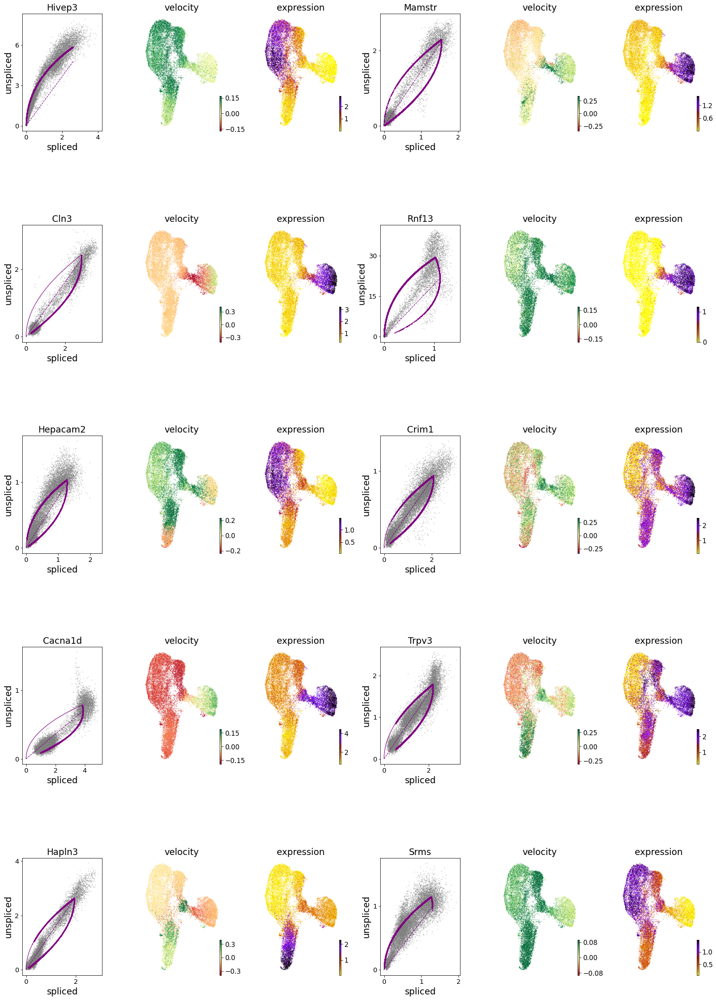

In [30]:
import matplotlib
font = {'family' : 'normal',
        'size'   : 22}
matplotlib.rc('font', **font)
scv.pl.velocity(adata_no_murk, top_genes, ncols=2,figsize=(8,14),size=10,basis="X_wnn.umap")


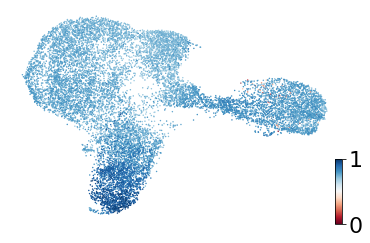

In [38]:
counts_s = scv.utils.sum_var(adata_no_murk.layers['spliced'])
counts_u = scv.utils.sum_var(adata_no_murk.layers['unspliced'])
fractions_u = counts_u / (counts_s + counts_u)
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import numpy as np
from matplotlib.colors import ListedColormap
cmap_blue = clr.LinearSegmentedColormap.from_list('custom blue', ['lightgrey','blue'], N=255)
scv.pl.scatter(adata_no_murk, color=fractions_u, smooth=True,basis="X_wnn.umap",color_map="RdBu",rescale_color=[0,1])

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


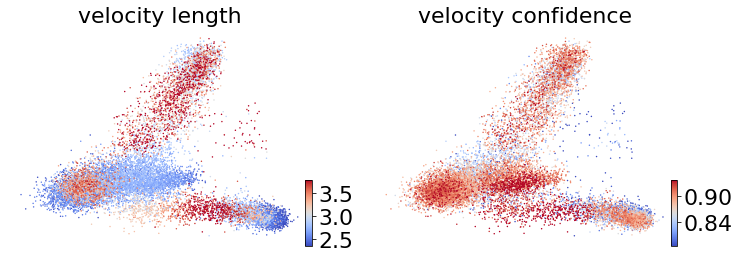

In [43]:
scv.tl.velocity_confidence(adata_no_murk)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_no_murk, c=keys, cmap='coolwarm', perc=[5, 95])


In [44]:
keys = 'velocity_length', 'velocity_confidence'
df = adata.obs.groupby('seurat_clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

KeyError: "Columns not found: 'velocity_confidence', 'velocity_length'"

In [ ]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot',size=80, colorbar=True,title = '')

Filtered out 629 genes that are detected 200 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:46) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:04) --> added
    'velocity_wnn.umap', embedded velocity vectors (adata.obsm)


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


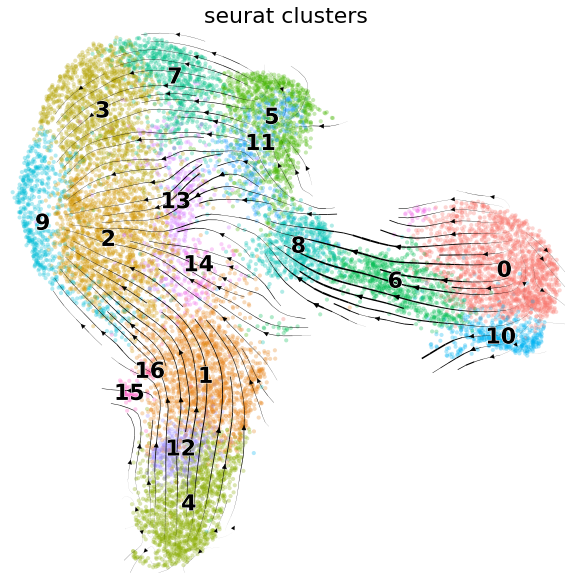

In [45]:

scv.pp.filter_and_normalize(adata_no_murk,min_shared_counts=200, n_top_genes=2000)
scv.pp.moments(adata_no_murk,n_neighbors=30)
# scv.tl.recover_dynamics(adata_no_murk, n_jobs = 20)
# scv.tl.velocity(adata_no_murk,mode="dynamical")
scv.tl.velocity(adata_no_murk)

scv.tl.velocity_graph(adata_no_murk)
colors = ['#F8766D','#E7851E','#D09400','#B2A100','#89AC00','#45B500','#00BC51','#00C087','#00C0B2','#00BCD6','#00B3F2','#29A3FF','#9C8DFF','#D277FF','#F166E8','#FF61C7','#FF689E']
cdict = {str(i):colors[i] for i in range(len(colors)) }
scv.pl.velocity_embedding_stream(adata_no_murk, basis="X_wnn.umap", color="seurat_clusters",figsize=(10,10),palette=cdict)


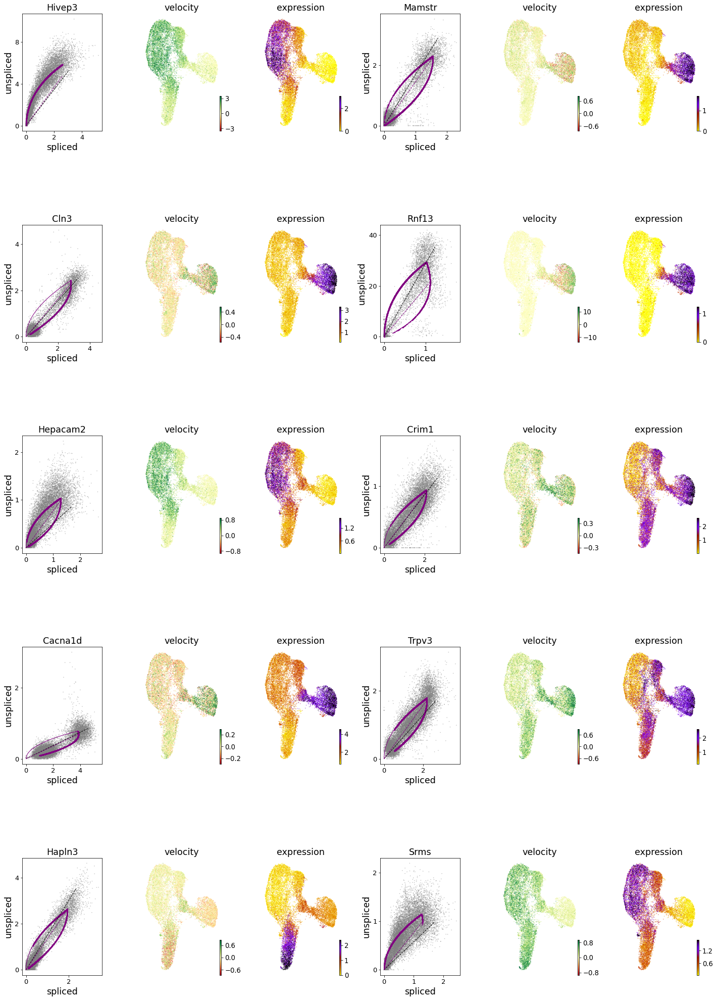

In [46]:
top_genes = adata_no_murk.var.sort_values('fit_likelihood', ascending=False).index[:10]
# scv.pl.scatter(adata_no_murk, basis=top_genes,figsize=)
scv.pl.velocity(adata_no_murk, top_genes, ncols=2,figsize=(8,14),size=10,basis="X_wnn.umap")


In [48]:
scv.tl.rank_velocity_genes(adata_no_murk, groupby='seurat_clusters', min_corr=.3)

df = scv.DataFrame(adata_no_murk.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:04) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,10,11,12,13,14,15,16,2,3,4,5,6,7,8,9
0,Rpl36,Wdr13,Rpl36,Prmt2,Fam241b,Hivep3,Hivep3,Kcnj10,Pam,Arap2,4930431P22Rik,Fam241b,Prmt2,Ppm1h,4930431P22Rik,Zbtb26,H2-T23
1,Sqstm1,Lig1,Sqstm1,Cxcr1,Cavin2,1700109K24Rik,Ccdc28a,Tpd52,Rab32,H2-T23,Cbx6,Wdfy4,1300014J16Rik,Gm26670,H2-T23,Ldb3,4930431P22Rik
2,Fam167a,Kdm5b,Tfec,AW551984,Arhgap17,Hepacam2,Hmx2,Apobr,Arap2,Cbx6,Rimklb,Skap1,Nap1l2,Cbfb,Cyp27a1,Gm17102,Cbx6
3,Acot1,Npy4r,Bcdin3d,Gm17102,Serpine2,Zfp980,AC159200.1,Galnt6,Zfpm1,AC159200.1,H2-T23,Gm5608,AW551984,Zbtb26,Rimklb,Gm43042,Arap2
4,Spdef,Rhoq,Syt14,Tmem132c,Rps27l,Bbx,Gm17102,Rnd2,Pcdhb1,4930431P22Rik,Tek,Map1b,Mx1,Iglv1,Dhrs3,Olfr986,Tek


In [1]:
df.head()

NameError: name 'df' is not defined